# Install Imports

In [1]:
import sys
!{sys.executable} -m pip install numpy scipy pillow scikit-image matplotlib
# works with python 3.7.3 numpy==1.15.4 scipy==1.5.4 scikit-image==0.16.1

# Import Modules

In [2]:
import numpy as np

import scipy.ndimage as ndimage

from skimage.metrics import structural_similarity as ssim

from PIL import Image

from os import listdir
from os.path import isfile, join

# Define Metrics

Root Mean Squared Error   
(Wajid, R., Mansoor, A. B., & Pedersen, M. (2014, December). A human perception based performance evaluation of image quality metrics. In International Symposium on Visual Computing (pp. 303-312). Springer, Cham.)
  
Mean Squared Error   
(Wajid, R., Mansoor, A. B., & Pedersen, M. (2014, December). A human perception based performance evaluation of image quality metrics. In International Symposium on Visual Computing (pp. 303-312). Springer, Cham.)
  
Structural Similarity Index   
(Wajid, R., Mansoor, A. B., & Pedersen, M. (2014, December). A human perception based performance evaluation of image quality metrics. In International Symposium on Visual Computing (pp. 303-312). Springer, Cham.)

In [3]:
def rmse(src, dst):
    return np.sqrt(np.mean(np.square(src - dst)))


def mse(src, pred):
    return np.linalg.norm(src - dst)


def metric(src, dst):
    
    rms = rmse(src, dst)
    ms = mse(src, dst)
    sim = ssim(src, dst, multichannel=True)
    
    return rms, ms, sim

# Pooling-based time aware color smoothing



In [4]:
def running_pooling(matrix, neighbors, frames, steps=2, step_at_two=False):
    work_matrix = np.copy(matrix)
    return_matrix = np.copy(matrix)

    # Set step start
    step_idx = 1 if step_at_two else 0
    
    voting_matrix = [[1 if (i < neighbors / 2 and j <= (i + 1 - step_idx) * steps) or (i == int(neighbors / 2)) or (i > neighbors / 2 and j <= (neighbors - i - step_idx) * steps) else 0 for j in range(frames)] for i in range(neighbors)]
    voting_matrix = np.array(voting_matrix).astype('bool')
    
    # Append ones at top and bottom
    work_matrix = np.concatenate((np.ones((int(neighbors / 2), work_matrix.shape[1], work_matrix.shape[2])), work_matrix), axis=0)
    work_matrix = np.concatenate((work_matrix, np.ones((int(neighbors / 2), work_matrix.shape[1], work_matrix.shape[2]))), axis=0)
    
    # Append ones at end
    work_matrix = np.append(work_matrix, np.ones((work_matrix.shape[0], frames - 1, work_matrix.shape[2])), axis=1)
   
    for i in range(work_matrix.shape[1] - frames + 1):
        y_work_matrix = work_matrix[:,i:i + frames]
        for j in range(y_work_matrix.shape[0] - neighbors + 1):
            y_sub_work_matrix = y_work_matrix[j:j + neighbors]
            voted_matrix = y_sub_work_matrix[voting_matrix]
            voted_matrix = voted_matrix[voted_matrix[:,2].argsort()]
            voted_matrix = voted_matrix[voted_matrix[:,1].argsort(kind='mergesort')]
            voted_matrix = voted_matrix[voted_matrix[:,0].argsort(kind='mergesort')]
            value = np.median(voted_matrix, axis=0)
            return_matrix[j, i] = value
    
    return return_matrix

# Gaussian Blur

https://docs.scipy.org/doc/scipy/reference/generated/scipy.ndimage.gaussian_filter.html



In [5]:
def running_gaussian(matrix, sigma):
    return_matrix = np.copy(matrix)

    for i in range(im2arr.shape[1]):
        return_matrix[:,i] = ndimage.gaussian_filter(matrix[:,i], sigma=sigma, order=0)
        
    return return_matrix

# Load Color Maps

In [6]:
rugs_path = 'rugs/'
rugs = [f for f in listdir(rugs_path) if isfile(join(rugs_path, f))]

In [7]:
rugs

['originalguo.png',
 'originalsimular.png',
 'originalcubediagonal.png',
 'originalfourcorners.png',
 'originalteuling.png',
 'originalspatialrug-case3.png',
 'originalmittelstaedtetal.png',
 'originalspatialrug.png',
 'originalramirezetal.png',
 'originalbremmetal.png']

# Load Color Maps into dict

In [8]:
rugs_images = []

for r in rugs:
    tmp_im = Image.open(join(rugs_path, r))
    tmp_im2arr = np.array(tmp_im)
    tmp_arr2im = Image.fromarray(tmp_im2arr)
    
    rugs_images.append({
        'path': join(rugs_path, r),
        'image': tmp_im,
        'array': tmp_im2arr,
        'imgarray': tmp_arr2im
    })

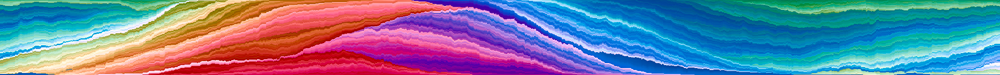

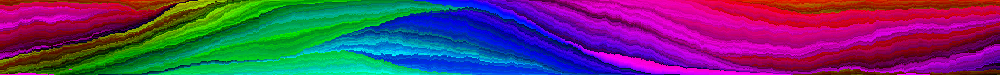

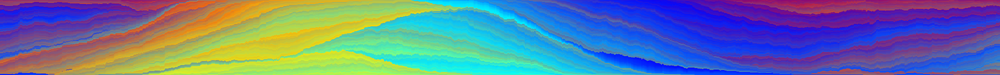

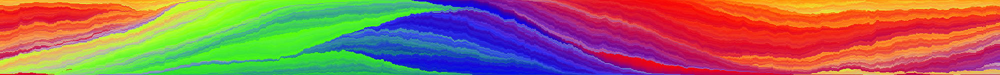

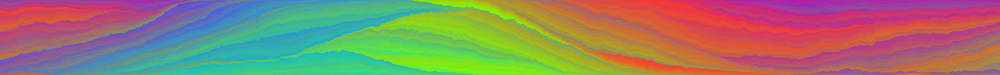

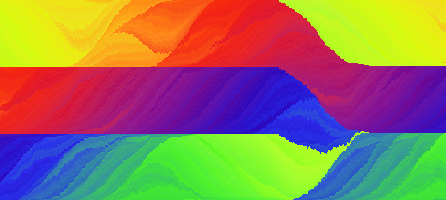

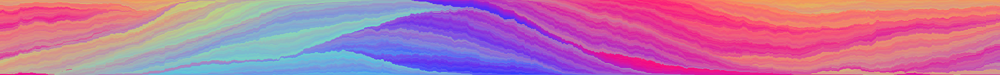

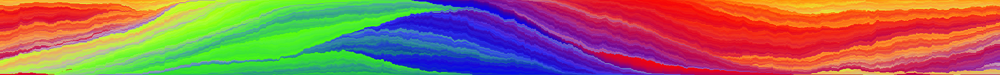

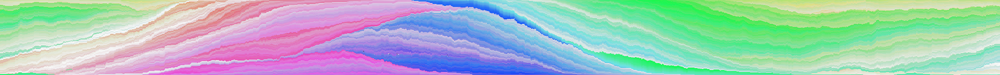

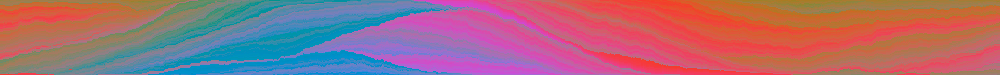

In [9]:
from IPython.display import display 

for r in rugs_images:
    display(r['image'])

# Color Smoothing For Color Maps

In [10]:
for i, r in enumerate(rugs_images):
    neighbor = running_pooling(r['array'], 15, 15, 2)
    rugs_images[i]['smoothed_array'] = neighbor
    rugs_images[i]['smoothed_image'] = Image.fromarray(neighbor)

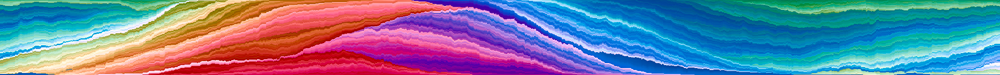

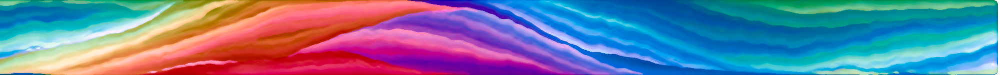

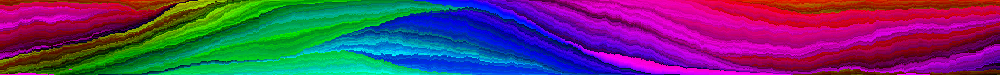

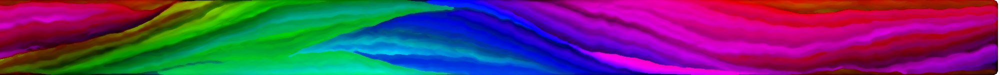

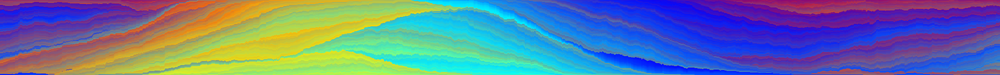

...

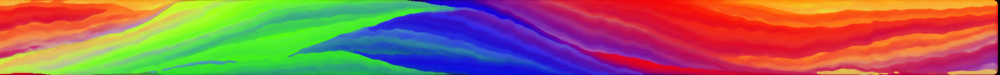

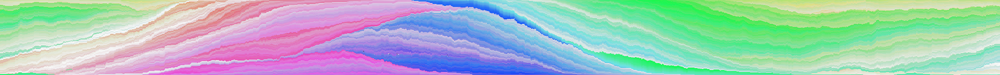

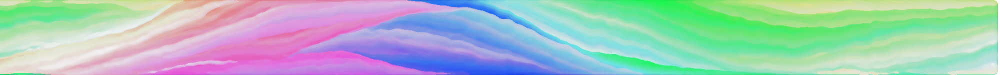

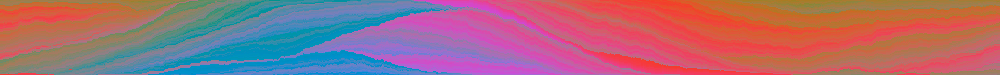

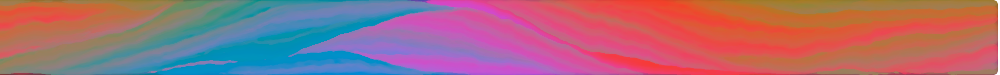

In [11]:
from IPython.display import display 

for r in rugs_images:
    display(r['image'])
    display(r['smoothed_image'])